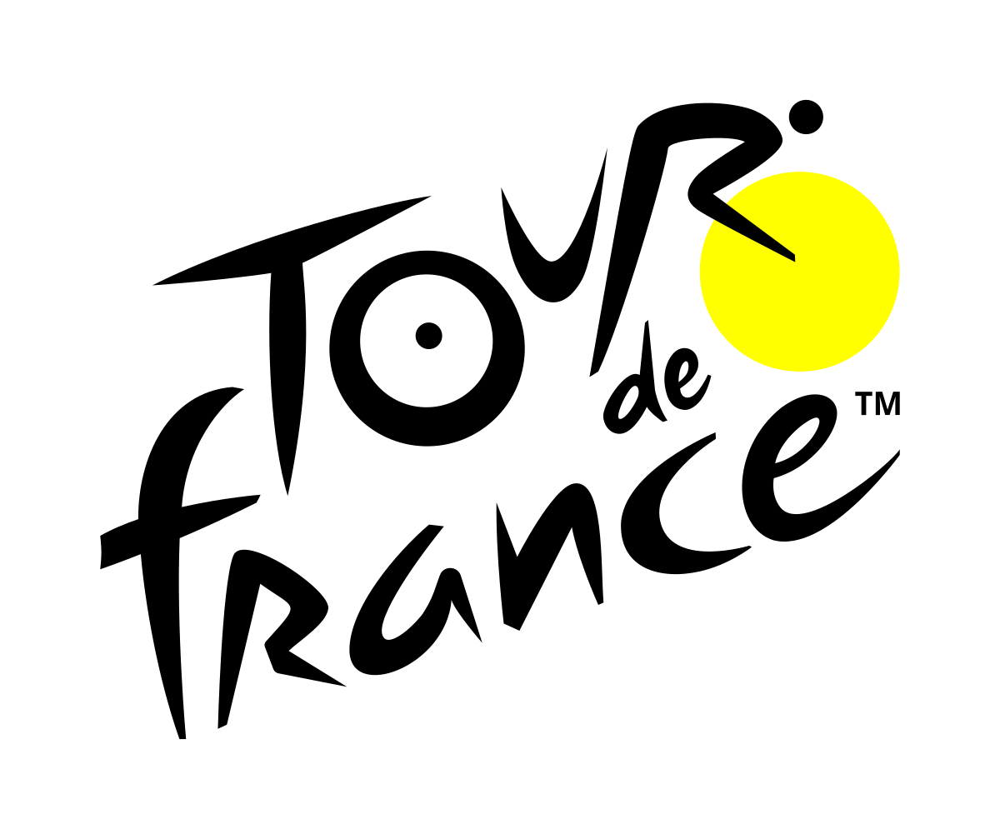

# Projet de visualisation des données du championnat de cyclisme dit 
###                                                                  << Tour de France >>

    Dans ce notebook nous faisons un parcours des différentes librairies apprises dans le cours de visualisation des données 
    
    En effet, nous allons exploiter les données du monde du cyclisme français, prises sur Kaggle, wikipedia et le site du Tour de France afin de représenter visuellement l'information qu'elles véhicules. 

# Table des matières
1. [**AVANT PROPOS**](#section1)
    1. [Procédure](#section1_1)
    2. [Bonus](#section1_2)
    3. [Autres](#section1_3)
2. [**LES DONNEES**](#section2)
    1. [Présentation des jeux de données](#subsection1)
3. [**DATA MANIPULATION**](#section3)

<a id="section1"></a>
## 1. Avant-Propos

Quid de la DataViz ?

D'une part, la visualisation des données est un ensemble de bonnes pratiques permettant de représenter l'information brute (qui existe sous format textuel, physique, sous forme de signaux ou autres).

En plus d'un coup d'oeil à la statistique, cette matière qui rejoint d'autre part la discipline de l'intelligence artificielle qui est la vision par ordinateur, requiere une connaissance minimal du beau. 

                       Nous osons donc dire que la visualisation des données est l'art de représenter l'information.

Prenons l'exemple de cette carte de la France, qui reprend le parcours de la 108e edition du tour de France attendu en juin prochain.

On y retrouve les villes, les dates, les points de départs et d'arrivés des différentes étapes. De quoi donner un sens atractif et simplifié, compréhensible pour la prochaine édition à tout ceux et toutes celles qui se reconnaissent être de vrai féru du cyclisme.

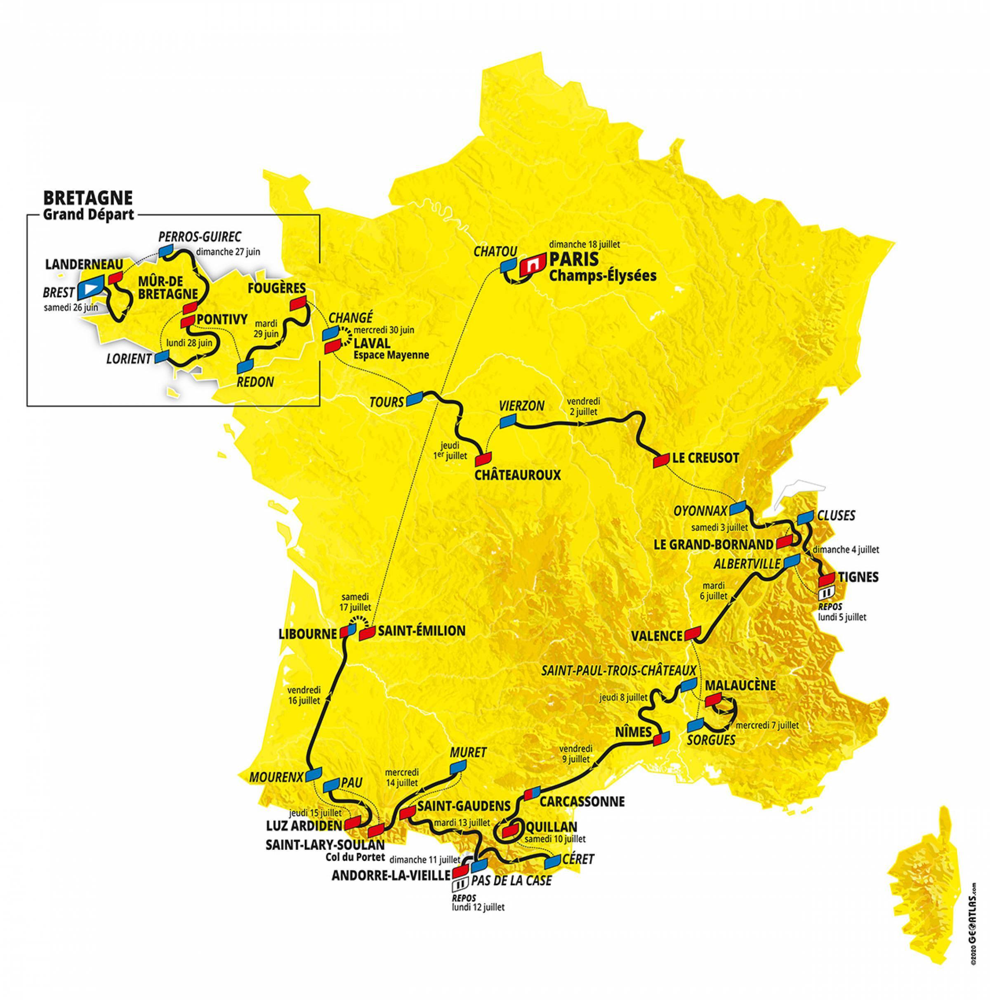

###### Et le tour de France en 2021 ?

En 2021, il se tiendra la 108ème édition du tour de France, pour cette année, dans l’Hexagone, 9 Régions et 31 départements seront visités.

Cette compétion possède à ce jours dans son palmarès 5 cyclistes comme étant les tenants du titre les plus titré(s), il s'agit notamment de :

* Tadej Pogacar
* Jacques Anquetil
* Eddy Merckxx
* Bernanrd Hinault et,
* Miguel Induain

quant au parcours, il se compose de la manière suivante :
    
    1) 8 étapes de plaine
    2) 5 étapes accidentées
    3) 6 étapes de montagne avec 3 arrivées en altitude
    4) 2 étapes contre la montre en individuel
    5) 2 journées de repos
    6) La 8e étape Vierzon > Le Creusot et,
    7) 248 km, sera la plus longue du Tour depuis 2000 les cyclistes iront de Belfort à Troyes soit 254.5 km

#### En terme de timing (chrono), contrairement aux 4 dernières années (2017 à 2020), il est prévue 2 étapes contre la montre en individuel, pour une distance totale de 58 km, 27 km entre Changé et Laval Espace Moyenne lors de la 5e étape et 31 km entre Libourne et Saint-Emilion à l'occasion de la 20e étape.

Les nouveautés pour cette édition :
    
    il s'agit de 10 nouvelle villes-étapes qui feront leur apparition sur la carte en effet, le tour de France est tel que, chaque année, un nouveau parcours se présente.

Le point de départ :
    
    Le point de départ s'effectue dans le Massif armoricain, en Brétagne. Puis suivront dans l'ordre : le Massif central, les Alpes et les Pyrénées. Il y aura par ailleurs une ascension inédite dans le Morvan, le signal d’Uchon.

Bonifications et bonus :
    
    Elles seront distribuées à l’arrivée de chaque étape en ligne et attribueront respectivement 10, 6 et 4 secondes aux trois premiers coureurs classés.
    
    les bonus seront seront attribués au passage des 6 cols ou sommets suivants situés à des endroits stratégiques du parcours et créditeront respectivement de 8, 5 et 2 secondes (sous réserve d’homologation de l’Union cycliste internationale) les trois premiers coureurs classés. 

    sources : 
    
 https://www.letour.fr/fr/ & https://fr.wikipedia.org/wiki/Tour_de_France

###### Avant de continuer nous vous proposons de découvrir en vidéo le déroulé des étapes de cette édition.

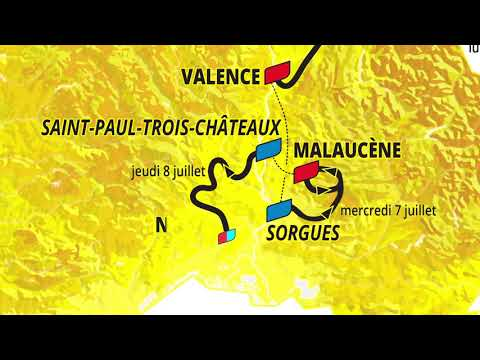

In [1]:
from IPython.display import YouTubeVideo
display(YouTubeVideo("nD7OUmte1D4"))

<a id="section1_2"></a>
### A) Procédure : nous nous proposons de présenter ce jeux de données sous un format de type 
######                                                                           << Data Story telling >>

1) Dans un premier temps nous allons afficher le contenu de notre dataset que nous utiliserons pour ensuite les expliquer.

2) Deuxièmement nous allons, apprès compréhension de son contenu, ressortir une série de questions auxquelles nous tenterrons d'y apporter des réponses, lesquelles ne seront rien d'autre que des visualisations.

3) Enfin, indépendament des deux étapes précédentes , nous allons essayé de mettre en pratique quelques notions de machines learning apprises en  L3 SD dans le cours de théorie bayésienne de la décision, en y ajoutant des bonnes pratiques de data-prépocessing découverts par auto-formation, question d'offrir des modèles d'apprentissages défiant toute situation de grande variance ou de biais afin de pourquoi pas ? prédire a nationalité d'une minorité de champion et, de l'équipe. Alors, notre modèle predictif sera-t-il à la hauteur ? à cette question seule l'avenir nous le confirmera.

<a id="section1_2"></a>
#### B) Bonus :

En plus de ce document, nous joignons aussi à ce travail les éléments suivant :

* Présentation du travail avec une vidéo
* Ainsi que les jeux de données

#### Afin de pouvoir concillier théorie et pratique pour une préparation efficace de notre futur carrière professionelle, notre objectif est donc de réaliser un travail excellent et louable, travail réalisé en vue d'obtenir un maximum de points possibles, tout en mettant en application les connaissances appréhendées dans le cours visualisation des données.

<a id="section1_3"></a>
#### C) Autres informations 

                          Au programme de cette année, 23 équipes s'affronteront
                          
Astana Premier Tech, Jumbo - Visma, Team DSM, Total Direct Energie, etc.
                          


<a id="section2"></a>
## 2. LES DONNEES ET LEUR VISUALISATION

In [2]:
import pandas as pd
import numpy as np
import seaborn as sns
!pip install chart_studio
import plotly as pty
import matplotlib.animation as animation

<a id="section3"></a>
### 3. Le Dataset : Les gagnants du tour de France, de 1903 à 2020

sources : 

https://en.wikipedia.org/wiki/List_of_Tour_de_France_general_classification_winners 

& 

https://www.kaggle.com/asanchez1994/tour-de-france-winners-19032019

Dans le dataset proposé par Andrew Sanchez, sur Kaggle, nous obtenon un jeux de données des différents champions du tour de france entre 1903 et 2019, il souligne cependant, que les années concernées par des troubles, des guerres et autres (de 1915 à 1918 durant la grippe espagnole et suite à la première guerre mondiale ainsi que, de 1940 à 1946 suite à la deuxième guerre mondiale, ce qui nous fait un total de 10 ans), ne sont pas prises en compte. A notre niveau ce que nous allons faire c'est en plus de partir de ce jeux de données, nous allons le compléter manuellement en y ajoutant le vainqueur de 2020, vainqueur dont nous prendrons les valeurs sur wikipedia.

In [4]:
df_winner0319 = pd.read_csv("tdf_winners0319.csv")

In [5]:
df_winner0319.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 106 entries, 0 to 105
Data columns (total 12 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   year              106 non-null    int64  
 1   country           106 non-null    object 
 2   cyclist           106 non-null    object 
 3   sponsor/team      106 non-null    object 
 4   distance_km       106 non-null    int64  
 5   overall_time      98 non-null     object 
 6   margin            98 non-null     object 
 7   stage_wins        106 non-null    int64  
 8   stages_in_lead    106 non-null    int64  
 9   controversial     106 non-null    bool   
 10  overall_time_sec  98 non-null     float64
 11  margin_sec        98 non-null     float64
dtypes: bool(1), float64(2), int64(4), object(5)
memory usage: 9.3+ KB


In [6]:
df_winner0319.head()

,year,country,cyclist,sponsor/team,distance_km,overall_time,margin,stage_wins,stages_in_lead,controversial,overall_time_sec,margin_sec
0,1903,France,Maurice Garin,La Française,2428,3 days 22:33:14.000000000,0 days 02:59:21.000000000,3,6,False,340394.0,10761.0
1,1904,France,Maurice Garin Henri Cornet[E],Conte,2428,4 days 00:05:55.000000000,0 days 02:16:14.000000000,1,3,False,345955.0,8174.0
2,1905,France,Louis Trousselier,Peugeot–Wolber,2994,NaN,NaN,5,10,False,NaN,NaN
3,1906,France,René Pottier,Peugeot–Wolber,4637,NaN,NaN,5,12,False,NaN,NaN
4,1907,France,Lucien Petit-Breton,Peugeot–Wolber,4488,NaN,NaN,2,5,False,NaN,NaN


#### On complète en rajoutant le gagant de 2020

In [7]:
new_row = {'year':2020, 'country':"Slovenie", 'cyclist':"Tadej Pogacar", 'sponsor/team':"UAE Team Emirates", 'distance_km':3484,'overall_time':'3 days 15:20:13.000000000','margin':'0 days 00:00:59.000000000','stage_wins':3,'stages_in_lead':1, 'controversial':False,'overall_time_sec':265813.0,'margin_sec':59.0}
#ajouter la row à la fin du dataframe
df_winner0319 = df_winner0319.append(new_row, ignore_index=True)

In [8]:
df_winner0319.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 107 entries, 0 to 106
Data columns (total 12 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   year              107 non-null    int64  
 1   country           107 non-null    object 
 2   cyclist           107 non-null    object 
 3   sponsor/team      107 non-null    object 
 4   distance_km       107 non-null    int64  
 5   overall_time      99 non-null     object 
 6   margin            99 non-null     object 
 7   stage_wins        107 non-null    int64  
 8   stages_in_lead    107 non-null    int64  
 9   controversial     107 non-null    bool   
 10  overall_time_sec  99 non-null     float64
 11  margin_sec        99 non-null     float64
dtypes: bool(1), float64(2), int64(4), object(5)
memory usage: 9.4+ KB


Je vous explique tout :

Ce dataset, constitué de 12 colonnes dont l'année de la compétition (de type entier), le pays d'origine du joueur (chaine=objet dans un dataframe), le nom du cycliste, l'équipe sponsor, la distance parcourue en Km, temps global de la course, la marge de victoire du vainqueur, le nombre de victoires d'étape du vainqueur, le nombre d'étapes dans lesquelles le gagnant était en tête, une controverse qui est vrai quand Lance Armstrong a gagné faux sinon ainsi que le délai global et de la marge exprimés en secondes.

Il contient 107 enregistrement qui corresponde chacun à une édition, les index vont de 0 à 106 et, il y a 8 valeurs null dans l'overall_time, le margin, l'overall_time_sec et le margin_sec respectivement.

In [9]:
df_winner0319.describe()

,year,distance_km,stage_wins,stages_in_lead,overall_time_sec,margin_sec
count,107.000000,107.000000,107.000000,107.000000,99.000000,99.000000
mean,1964.392523,4205.252336,2.738318,10.700935,450830.010101,969.555556
std,34.406767,704.486125,1.834350,5.366238,150029.142304,1700.381645
min,1903.000000,2428.000000,0.000000,1.000000,265813.000000,8.000000
25%,1933.500000,3649.500000,1.000000,6.000000,332457.000000,190.000000
50%,1967.000000,4138.000000,2.000000,12.000000,412531.000000,379.000000
75%,1993.500000,4649.000000,4.000000,14.000000,513233.000000,922.500000
max,2020.000000,5745.000000,8.000000,22.000000,859465.000000,10761.000000


sur les 12 valeurs, il n'y a que 6 qui sont calculables, ce que je vais me proposer de faire plus loin c'est décomposer le "overall_time" et le "margin" en days_time, day_margin et, times_hours, times_hours qui reprendront respectivement les jours et le temps en heure.

Avant d'aborder la partie des questions, on doit comprendre que, les valeurs NaN ne nous aide pas car, elle ne nous permettent pas de se renseigner suffisment sur les éditions cocnernés ou, le champion de l'édition. ce qui plus loin peu nous porter préjudices et pourtant, ces vainqueurs ont biens une histoire, un délai de temps parcouru, etc. Nous allons donc retenir la meilleure alternative pour palier à cette situation :

    1) Soit on va cherhcer sur google les ifnormations manquantes
    2) Soit on remplace toutes ces valeurs par 0
    3) Soit on remplace ces valeurs par la valeur médian
    4) soit on remplace par la veleur moyenne
    5) soit on attribue une valeur quelconque
    6) Soit on supprime les lignes soit, on supprime les colonnes soit les lignes et les colonnes

In [10]:
df_winner0319[df_winner0319.margin.isna()]

,year,country,cyclist,sponsor/team,distance_km,overall_time,margin,stage_wins,stages_in_lead,controversial,overall_time_sec,margin_sec
2,1905,France,Louis Trousselier,Peugeot–Wolber,2994,NaN,NaN,5,10,False,NaN,NaN
3,1906,France,René Pottier,Peugeot–Wolber,4637,NaN,NaN,5,12,False,NaN,NaN
4,1907,France,Lucien Petit-Breton,Peugeot–Wolber,4488,NaN,NaN,2,5,False,NaN,NaN
5,1908,France,Lucien Petit-Breton,Peugeot–Wolber,4497,NaN,NaN,5,13,False,NaN,NaN
6,1909,Luxembourg,François Faber,Alcyon–Dunlop,4498,NaN,NaN,6,13,False,NaN,NaN
7,1910,France,Octave Lapize,Alcyon–Dunlop,4734,NaN,NaN,4,3,False,NaN,NaN
8,1911,France,Gustave Garrigou,Alcyon–Dunlop,5343,NaN,NaN,2,13,False,NaN,NaN
9,1912,Belgium,Odile Defraye,Alcyon–Dunlop,5289,NaN,NaN,3,13,False,NaN,NaN


la recherche d'information de données aussi précis sur internet n'étant pas simple, une autre alternative serait donc de cherhcer les valeurs moyennes de chaque cycliste, selon que ceux-ci ont plus d'une victoire. La moyenne comme paramètre de tendance centrale est idéal dans ce context où la dispersion des données de ces mêmes cyclistes peut se faire dans une dimension où le nombre d'occurence constitue un petit échantillon (distribué au tour de la moyenne).

Cependant cela reste impossible car aucun de ces cyclist ne possède plus d'une victoire ou plus d'une victoire avce les données recherhcés.

Supprimer les colonnes n'est pas une bonne idéee car :

In [11]:
8*100/107

7.4766355140186915

7% est la proportion des occurences manquantes sur l'ensemble du dataset, ce qui rend le fait de supprimer les colonnes insignifiantes, par contres supprimer les lignes aurait pu être une solution sauf que ces valeurs nous sont aussi importantes du fait qu'elle représente les différnetes éditions.

On ne peut pas non plus attribuer une valeur quelconque sinon cela perdre tout son sens, garder la valeur NaN ne nous aide pas et chercher la valeur médian c'ets comme chercher la valeur moyenne.

###### d'où la seule solution qui nous permet de grader notre dataset tel qu'on l'a eu mais la rendant ainsi explitable c'est de décomposer l'overall_time en day et hour, puis, d'attribuer la valeur null à chaque NaN.

In [12]:
def get_dfs(df):
    nan_rows = df[df.overall_time.isna()] #on fait des données avec un nan un dataframe
    good_df = df[~df.overall_time.isna()] #on récupère un df sans 
    return nan_rows, good_df

In [13]:
#on renvoie le temps en nombre de jour.s et l'heure
#On base de donnée on parle de normaliser la structure avec les fomres normales afin de faciliter son traitement
def get_frag(data):
    data = data.split(" ")
    day = data[0]
    hour = data[2]
    return day, hour

In [14]:
#on renvoie le temps
import time

def get_df_fragment(df_):
    times = []
    margins = []     
    
    o=df_["overall_time"]
    m=df_["margin"]    
    ind=df_.index
    
    for i in range(len(df_)):             
        
        
        stringO = o.iloc[i]
        stringM = m.iloc[i]        
        
        #on convertie ces cellule de Object to string  

        day, hour=get_frag(stringO)
        
        times.append(dict(
            index1 = ind[i],
            times_days=day,
            times_hours=hour
        ))
        
        day, hour=get_frag(stringM)
        
        margins.append(dict(
            index2 = ind[i],
            margin_day=day,
            margin_hours=hour
        ))
    
    
    return times, margins

In [15]:
def dfformat(df__):
    df__['index'] = range(len(df__)) 
    return df__

In [16]:
def df_processing(df__):
    
    df__ = dfformat(df__)
    df_nan, df_not_nan = get_dfs(df__) #on récupère les deux df avec et sans nan
    times, margins = get_df_fragment(df_not_nan) #on récupère le temps dans les df sans nan
    
    # On remplace les NaN par 0.0
    
    df_nan.overall_time_sec=0.0
    df_nan.margin_sec=0.0
    
    # on rajoute et on ordonne (selon l'ordre des indexs) les 8 valeurs manquantes dans le df avec nan
    
    df_final = pd.concat([df_not_nan, df_nan],axis=0)
    
    df_final = df_final.sort_index() 
    
    # on supprime les colonnes overall_time et magin dans les 2 df
    
    df_final = df_final.drop(["overall_time","margin"], axis=1)
    
    # on convertie les dictionnaires en DataFrame
    
    df_times = pd.DataFrame.from_dict(times)
    df_margin = pd.DataFrame.from_dict(margins)
    
    # On merge les 2 DF
    
    df_merge = pd.merge(left=df_margin, right=df_times,how='left', left_on='index2',right_on='index1') 
    
    # On merge le df final et les 4 colonnes
    
    df_final = pd.merge(left=df_final, right=df_merge,how='left', left_on='index',right_on='index1')
    
    # On enlève les index
    
    df_final = df_final.drop(["index", "index1", "index2"], axis=1)   
    
    # On remplace les NaN par 0, 0.0 et 00:00:00.000000000
    
    df_final.margin_day=0
    df_final.loc[2:9,"times_days"]=0
    df_final.loc[2:9,"margin_hours"]="00:00:00.000000000"
    df_final.loc[2:9,"times_hours"]="00:00:00.000000000"e
    
    # On convertie les margin et times hours en datetime
    
    df_final['margin_hours'] =  pd.to_datetime(df_final['margin_hours'], format='%H:%M:%S.%f').dt.time
    df_final['times_hours'] =  pd.to_datetime(df_final['times_hours'], format='%H:%M:%S.%f').dt.time
    
    return df_final

In [17]:
df=df_processing(df_winner0319)

C:\ProgramData\Anaconda3\lib\site-packages\pandas\core\generic.py:5168: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self[name] = value


In [18]:
df

,year,country,cyclist,sponsor/team,distance_km,stage_wins,stages_in_lead,controversial,overall_time_sec,margin_sec,margin_day,margin_hours,times_days,times_hours
0,1903,France,Maurice Garin,La Française,2428,3,6,False,340394.0,10761.0,0,02:59:21,3,22:33:14
1,1904,France,Maurice Garin Henri Cornet[E],Conte,2428,1,3,False,345955.0,8174.0,0,02:16:14,4,00:05:55
2,1905,France,Louis Trousselier,Peugeot–Wolber,2994,5,10,False,0.0,0.0,0,00:00:00,0,00:00:00
3,1906,France,René Pottier,Peugeot–Wolber,4637,5,12,False,0.0,0.0,0,00:00:00,0,00:00:00
4,1907,France,Lucien Petit-Breton,Peugeot–Wolber,4488,2,5,False,0.0,0.0,0,00:00:00,0,00:00:00
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
102,2016,Great Britain,Chris Froome,Team Sky,3529,2,14,False,320688.0,245.0,0,00:04:05,3,17:04:48
103,2017,Great Britain,Chris Froome,Team Sky,3540,0,15,False,310855.0,54.0,0,00:00:54,3,14:20:55
104,2018,Great Britain,Geraint Thomas,Team Sky,3349,2,11,False,299833.0,111.0,0,00:01:51,3,11:17:13
105,2019,Colombia,Egan Bernal#,Team Ineos,3349,0,2,False,298620.0,71.0,0,00:01:11,3,10:57:00


In [19]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 107 entries, 0 to 106
Data columns (total 14 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   year              107 non-null    int64  
 1   country           107 non-null    object 
 2   cyclist           107 non-null    object 
 3   sponsor/team      107 non-null    object 
 4   distance_km       107 non-null    int64  
 5   stage_wins        107 non-null    int64  
 6   stages_in_lead    107 non-null    int64  
 7   controversial     107 non-null    bool   
 8   overall_time_sec  107 non-null    float64
 9   margin_sec        107 non-null    float64
 10  margin_day        107 non-null    int64  
 11  margin_hours      107 non-null    object 
 12  times_days        107 non-null    object 
 13  times_hours       107 non-null    object 
dtypes: bool(1), float64(2), int64(5), object(6)
memory usage: 16.8+ KB


On convertie le "times_days" en int32

In [20]:
df.times_days=df.times_days.astype("int32")

###### Au terme de cette étape, on peut conclure avoir effectué un traitement qui simplifie l'usage de ce dataframe, ainsi nous avons convertie << le temps global de la course, la marge de victoire du vainqueur >> en, << Nombre de jour global de la course du vainqueur (times_days), la durée global en heure (times_hours) aussi, nous avons séparé en nombre de jour la (margin_day:qui ne nous sert à rien car ces valerus sont nul et donc, que nous allons supprimer) et, le margin_hours (qui représente le nombre d'heure (temps) selon la marge de victoire du vainqueur>>.

In [21]:
df = df.drop(["margin_day"], axis=1)

In [22]:
df

,year,country,cyclist,sponsor/team,distance_km,stage_wins,stages_in_lead,controversial,overall_time_sec,margin_sec,margin_hours,times_days,times_hours
0,1903,France,Maurice Garin,La Française,2428,3,6,False,340394.0,10761.0,02:59:21,3,22:33:14
1,1904,France,Maurice Garin Henri Cornet[E],Conte,2428,1,3,False,345955.0,8174.0,02:16:14,4,00:05:55
2,1905,France,Louis Trousselier,Peugeot–Wolber,2994,5,10,False,0.0,0.0,00:00:00,0,00:00:00
3,1906,France,René Pottier,Peugeot–Wolber,4637,5,12,False,0.0,0.0,00:00:00,0,00:00:00
4,1907,France,Lucien Petit-Breton,Peugeot–Wolber,4488,2,5,False,0.0,0.0,00:00:00,0,00:00:00
...,...,...,...,...,...,...,...,...,...,...,...,...,...
102,2016,Great Britain,Chris Froome,Team Sky,3529,2,14,False,320688.0,245.0,00:04:05,3,17:04:48
103,2017,Great Britain,Chris Froome,Team Sky,3540,0,15,False,310855.0,54.0,00:00:54,3,14:20:55
104,2018,Great Britain,Geraint Thomas,Team Sky,3349,2,11,False,299833.0,111.0,00:01:51,3,11:17:13
105,2019,Colombia,Egan Bernal#,Team Ineos,3349,0,2,False,298620.0,71.0,00:01:11,3,10:57:00


#### Question :

    Nous pouvons à présent nous poser certaines questions et les résoudre. En plus de partir d'utiliser le DataFrame df, nous allons présenter ces réponses en utilisant les couleurs jaunes, noirs, rouges, bleu et blanches, qui sont apparement les couleurs de la charte graphique du Tour de France.
    
        0) Observons la distribution statistique de chaque variable
        1) A l'aide d'une map, nous voulons observer le pays de provenance des cyclistes.
        2) Nous voulons aussi apprécier l'évolution des Kilométrages par Cycliste, au cours du temps annuel.
        3) Nous voulons obtenir les mêmes représentations que le point précédent pour le temps global en heure et en 
           jours de la course par rapport à chaque joueurs.           
        4) Nous voulons connaître le pays qui revient le plus (fréquences).
        5) Nous voulons connaître pour chaque équipe, les paramètres de tendances centrales ou de positions suivants 
           (la médiane les quartiles) les statistiques suivant (min et max de la serie des données de kilomètre pour 
           réalisé par chaque équipe), le totu à l'aide des box plots.
        6) Nous voulons examiner la proportion qu'occupe Lance Armstrong depuis la première édition du tour de France et, en 
           fonction de tous les autres vainqueurs à l'aide d'un camembert.
        7) Nous voulons établir une compariason en terme Kilométrage, du nombre de victoires d'étape du vainqueur et, 
           du nombre d'étapes dans lesquelles le gagnant était en tête, de 5 cyclistes, par ordre de nombre de victoire.
        8) Observons l'évolution (dynamique ou animé) temporel des différents vainqueurs au cours du temps
        9) Visualiser les 5 meilleures équipes (celles qui se répètent le plus) en terme de fréquence
        10) Trouver graphiquement les moyennes de toutes les variables quantitatives
        11) Nous voulons observer si il existe une correlation entre toutes les variables numériques.
        12) A la suite de l'étape précédente, nous allons décomposer le df en suivant la règle du pareto,  
            afin de prédire l'année de victoire d'e n'importe d'une occurence (joeuur) de ces 107 édition .

### Importation des librairies de visualisation

In [23]:
!pip install plotly

In [24]:
import matplotlib.pyplot as plt
import seaborn as sns
import folium as flm
import numpy as np

### Réponses :

###### 0) Observons la distribution statistique de chaque variable

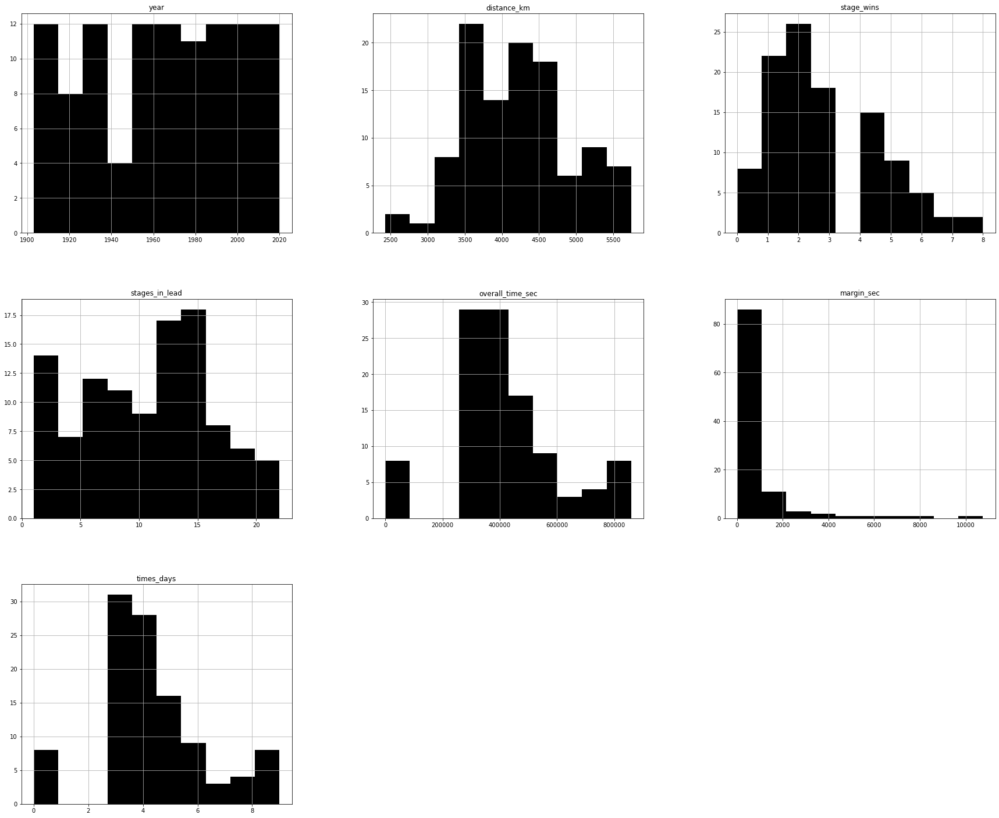

In [25]:
%matplotlib inline
attributs = ["year","distance_km","stage_wins","stages_in_lead","overall_time_sec","margin_sec", "times_days"]
df[attributs].hist(figsize=(30,25),color='black')
plt.show()

#### 1) A l'aide d'une map, nous voulons observer le pays de provenance des cyclistes.

In [26]:
world = flm.Map(location=[0,0], zoom_start=2)

In [27]:
wc = pd.read_json("world-countries.json")

In [28]:
world

In [29]:
flm.LayerControl().add_to(world)

In [30]:
flm.Choropleth(
    geo_data=wc,
    name='Origine des jouers',
    data=df,
    columns=['country', 'cyclist'],
    key_on='feature.properties.name',
    fill_color='PuRd',
    nan_fill_color='white'
).add_to(world)

folium.LayerControl(collapsed=True).add_to(world)

 #### 2) Nous voulons aussi apprécier l'évolution des Kilométrages par Cycliste, au cours du temps annuel.

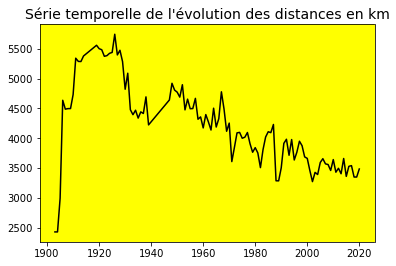

In [31]:
ax = plt.axes()
ax.set(facecolor = "yellow")
plt.title("Série temporelle de l'évolution des distances en km",fontsize=14)
plt.plot(df["year"],df["distance_km"],color="#000000")

#### 3) Nous voulons obtenir les mêmes représentations que le point précédent pour le temps global en jours de la course par rapport à chaque joueurs. 

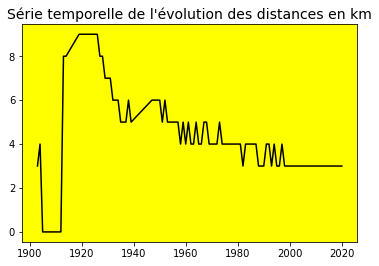

In [32]:
ax = plt.axes()
ax.set(facecolor = "yellow")
plt.title("Série temporelle de l'évolution des distances en km",fontsize=14)
plt.plot(df["year"],df["times_days"], color="#000000")

#### 4) Nous voulons connaître les pays qui revient le plus (fréquences) à l'aide d'un barh.

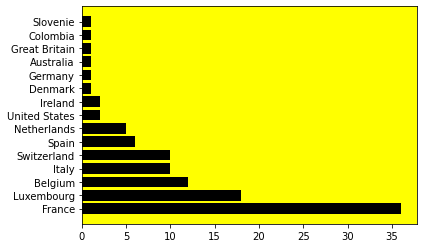

In [33]:
ax = plt.axes()
ax.set(facecolor = "yellow")
x = np.array(df.country.unique())
y = np.array(df.country.value_counts())
plt.barh(x, y, color="#000000")
plt.show()

#### 5) Nous voulons connaître pour chaque équipe, les paramètres de tendances centrales ou de positions suivants (la médiane les quartiles) les statistiques suivant (min et max de la serie des données de kilomètre pour réalisé par chaque équipe), le totu à l'aide des box plots.

In [34]:
import plotly.express as px

fig = px.box(df, x="sponsor/team", y="distance_km")

fig.update_layout(
    paper_bgcolor='yellow',
    plot_bgcolor='black',
)

fig.show()

#### 6) Nous voulons examiner la proportion qu'occupe Lance Armstrong depuis la première édition du tour de France et, en fonction de tous les autres vainqueurs à l'aide d'un camembert.

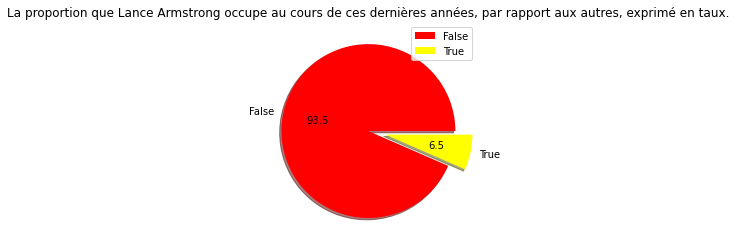

In [35]:
df_cont_value=pd.DataFrame(df.controversial.value_counts())
Xvalues = [df_cont_value.iloc[0,0],df_cont_value.iloc[1,0]]
Ycategory = [df_cont_value.index[0],df_cont_value.index[1]]

mycolors = ['red','yellow']
myexplode = [0,0.2]

plt.title("La proportion que Lance Armstrong occupe au cours de ces dernières années, par rapport aux autres, exprimé en taux.")
plt.pie(Xvalues, labels = Ycategory, explode = myexplode, shadow = True,colors = mycolors,autopct='%.1f')
plt.legend()
plt.show() 

#### 7) Nous voulons établir une compariason en terme Kilométrage, du nombre de victoires d'étape du vainqueur et,  du nombre d'étapes dans lesquelles le gagnant était en tête, de 5 cyclistes, par ordre de nombre de victoire.

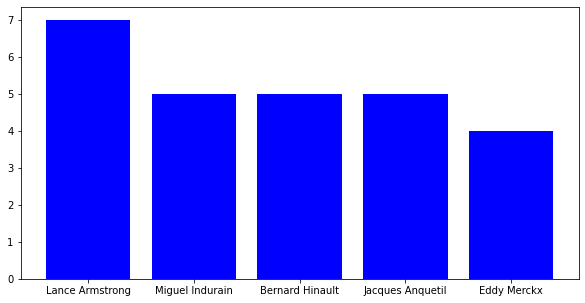

In [36]:
#trouvons d'abord le nombre de victoire des 5er cyclistes
NofVictByCyclist=pd.DataFrame(df.cyclist.value_counts()[0:5])
plt.figure(figsize=(10,5))
x = np.array(NofVictByCyclist.index)
y = np.array(NofVictByCyclist.iloc[:,0])
plt.bar(x,y,color="blue")
plt.show()

In [37]:
df_wl=pd.DataFrame({'cyclist':df.cyclist,'stage_wins':df.stage_wins,'stages_in_lead':df.stages_in_lead})

In [38]:
df_w=df_wl
df_w=df_w.groupby('cyclist').sum()[['stage_wins']].sort_values(by='stage_wins', ascending=False)[0:5]
df_w

,stage_wins
cyclist,
Eddy Merckx,24
Bernard Hinault,21
Lance Armstrong,20
Jacques Anquetil,16
Miguel Indurain,10


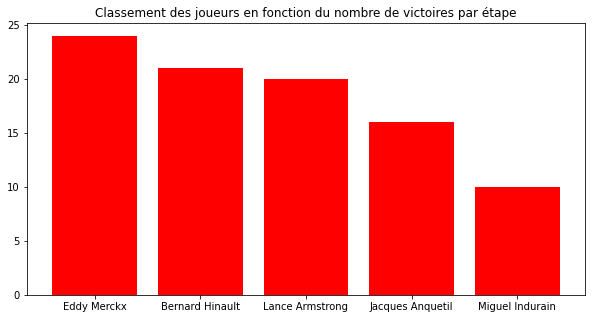

In [39]:
plt.figure(figsize=(10,5))
x = np.array(df_w.index)
y = np.array(df_w.iloc[:,0])
plt.bar(x,y,color="red")
plt.title("Classement des joueurs en fonction du nombre de victoires par étape")
plt.show()

In [40]:
df_l=df_wl
df_l=df_l.groupby('cyclist').sum()[['stages_in_lead']].sort_values(by='stages_in_lead', ascending=False)[0:5]
df_l

,stages_in_lead
cyclist,
Lance Armstrong,83
Eddy Merckx,68
Bernard Hinault,66
Miguel Indurain,60
Jacques Anquetil,50


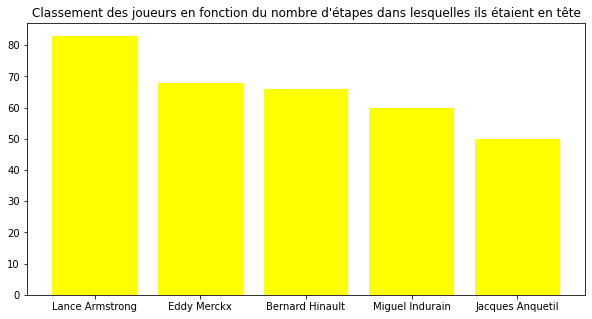

In [41]:
plt.figure(figsize=(10,5))
x = np.array(df_l.index)
y = np.array(df_l.iloc[:,0])
plt.bar(x,y,color="yellow")
plt.title("Classement des joueurs en fonction du nombre d'étapes dans lesquelles ils étaient en tête")
plt.show()

In [42]:
df_k=pd.DataFrame({'cyclist':df.cyclist,'distance_km':df.distance_km})
df_k=df_k.groupby('cyclist').sum()[['distance_km']].sort_values(by='distance_km', ascending=False)[0:5]
df_k

,distance_km
cyclist,
Lance Armstrong,24490
Jacques Anquetil,21982
Miguel Indurain,19224
Bernard Hinault,19042
Philippe Thys,16170


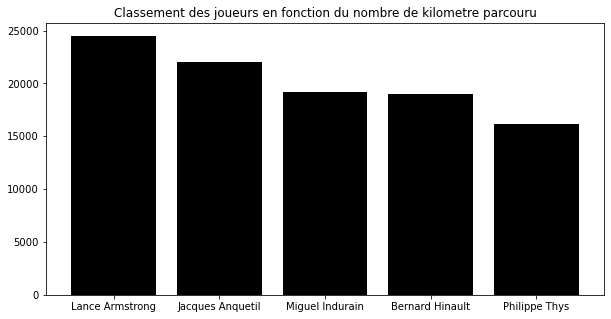

In [43]:
plt.figure(figsize=(10,5))
x = np.array(df_k.index)
y = np.array(df_k.iloc[:,0])
plt.bar(x,y,color="black")
plt.title("Classement des joueurs en fonction du nombre de kilometre parcouru")
plt.show()

Interprétation du résultat :

#### 8) Observons l'évolution (dynamique ou animé) temporel des différents vainqueurs au cours du temps

In [44]:
un = [df['distance_km'].min(), df['stage_wins'].max()]
li = [df['stage_wins'].min(),df['distance_km'].max()]


def update(current):
    if current == df['year'].max():
        a.event_source.stop()
    plt.cla()
    data_ = df[df['year']==current]
    sns.scatterplot(x='Cyclist',y='distance_km',hue='country',
                sizes=(20,200),data=data_,picker=3)
    plt.ylabel("year")
    plt.xlabel("distance_km")
    plt.show()
    plt.gca().set_xlim(li)
    plt.gca().set_ylim(un)   
    plt.subplots_adjust(top=0.9)
    plt.gca().set_title(current, loc='left')
    
fig = plt.figure()
a = animation.FuncAnimation(fig,
                            update,
                            interval=1,
                            frames=np.arange(1903,df['year'].max())
                           )

<Figure size 432x288 with 0 Axes>

#### 9) Visualiser les 5 meilleures équipes (celles qui se répètent le plus) en terme de fréquence

In [45]:
#trouvons d'abord le nombre de victoire des 5er cyclistes
team=pd.DataFrame(df.loc[:,'sponsor/team'].value_counts()[0:5])
team

,sponsor/team
France,12
Alcyon–Dunlop,8
Peugeot–Wolber,7
U.S. Postal Service,6
Team Sky,6


In [46]:
team=team.rename(columns={'sponsor/team': 'st'})

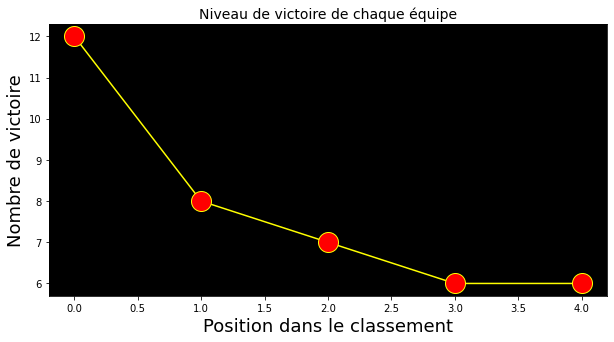

In [47]:
plt.figure(figsize=(10,5))
ax = plt.axes()
ax.set(facecolor = "black")
ypoints = np.array(team.loc[:,'st'])
Yteam = [team.index[0],team.index[1],team.index[2],team.index[3],team.index[4]]
plt.xlabel('Position dans le classement' , fontsize = 18)
plt.ylabel('Nombre de victoire' , fontsize = 18)
plt.title("Niveau de victoire de chaque équipe" ,fontsize = 14)
plt.plot(ypoints, marker = 'o', ms = 20, mfc = 'r', color="yellow")
plt.show()

#### 10) Trouver graphiquement les moyennes de toutes les variables quantitatives

In [48]:
df.describe()

,year,distance_km,stage_wins,stages_in_lead,overall_time_sec,margin_sec,times_days
count,107.000000,107.000000,107.000000,107.000000,107.000000,107.000000,107.000000
mean,1964.392523,4205.252336,2.738318,10.700935,417123.093458,897.065421,4.336449
std,34.406767,704.486125,1.834350,5.366238,187089.670118,1654.910408,2.149787
min,1903.000000,2428.000000,0.000000,1.000000,0.000000,0.000000,0.000000
25%,1933.500000,3649.500000,1.000000,6.000000,323386.500000,106.000000,3.000000
50%,1967.000000,4138.000000,2.000000,12.000000,403722.000000,299.000000,4.000000
75%,1993.500000,4649.000000,4.000000,14.000000,506672.500000,866.000000,5.000000
max,2020.000000,5745.000000,8.000000,22.000000,859465.000000,10761.000000,9.000000


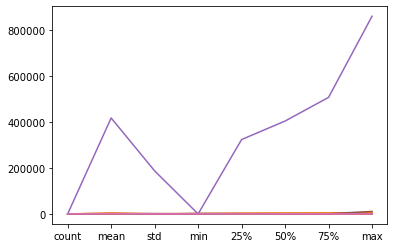

In [49]:
plt.plot(df.describe())

euhh...oui ce graphique ne seert presque à rien 😅

#### 11) Nous voulons observer si il existe une correlation entre toutes les variables numériques.

array([[<AxesSubplot:xlabel='year', ylabel='year'>,
        <AxesSubplot:xlabel='distance_km', ylabel='year'>,
        <AxesSubplot:xlabel='stage_wins', ylabel='year'>,
        <AxesSubplot:xlabel='stages_in_lead', ylabel='year'>,
        <AxesSubplot:xlabel='overall_time_sec', ylabel='year'>,
        <AxesSubplot:xlabel='margin_sec', ylabel='year'>,
        <AxesSubplot:xlabel='times_days', ylabel='year'>],
       [<AxesSubplot:xlabel='year', ylabel='distance_km'>,
        <AxesSubplot:xlabel='distance_km', ylabel='distance_km'>,
        <AxesSubplot:xlabel='stage_wins', ylabel='distance_km'>,
        <AxesSubplot:xlabel='stages_in_lead', ylabel='distance_km'>,
        <AxesSubplot:xlabel='overall_time_sec', ylabel='distance_km'>,
        <AxesSubplot:xlabel='margin_sec', ylabel='distance_km'>,
        <AxesSubplot:xlabel='times_days', ylabel='distance_km'>],
       [<AxesSubplot:xlabel='year', ylabel='stage_wins'>,
        <AxesSubplot:xlabel='distance_km', ylabel='stage_wins'>,
    

<Figure size 1080x360 with 0 Axes>

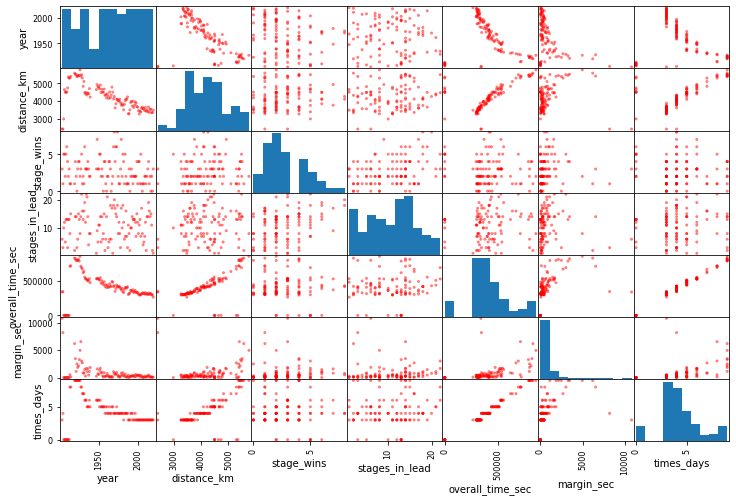

In [53]:
plt.figure(figsize=(15,5))
attributes = ["year","distance_km","stage_wins","stages_in_lead","overall_time_sec","margin_sec","times_days"]
pd.plotting.scatter_matrix(df[attributes], figsize=(12,8), color=["red"])

#### 12) A la suite de l'étape précédente, nous allons décomposer le df en suivant la règle du pareto,  afin de prédire l'la distance parcourue par n'importe quelle occurence (joueur) de ces 107 édition . Nous choisissons la sistance car elle possède plius de correlation avec les autres variables et donc semble être la plus fiable à prédire.

Commençons d'abord par renommer la sponsor/team par st

In [54]:
df=df.rename(columns={'sponsor/team': 'st'})

élaguons les variables et ne restons qu'avec les plus importantes : celle qui nous semble apporteront moins de bruit à nos algos.

In [55]:
df = df.drop(["controversial","margin_hours","times_hours"], axis=1)

DataFrame dédié à la prédiction.

In [56]:
df

,year,country,cyclist,st,distance_km,stage_wins,stages_in_lead,overall_time_sec,margin_sec,times_days
0,1903,France,Maurice Garin,La Française,2428,3,6,340394.0,10761.0,3
1,1904,France,Maurice Garin Henri Cornet[E],Conte,2428,1,3,345955.0,8174.0,4
2,1905,France,Louis Trousselier,Peugeot–Wolber,2994,5,10,0.0,0.0,0
3,1906,France,René Pottier,Peugeot–Wolber,4637,5,12,0.0,0.0,0
4,1907,France,Lucien Petit-Breton,Peugeot–Wolber,4488,2,5,0.0,0.0,0
...,...,...,...,...,...,...,...,...,...,...
102,2016,Great Britain,Chris Froome,Team Sky,3529,2,14,320688.0,245.0,3
103,2017,Great Britain,Chris Froome,Team Sky,3540,0,15,310855.0,54.0,3
104,2018,Great Britain,Geraint Thomas,Team Sky,3349,2,11,299833.0,111.0,3
105,2019,Colombia,Egan Bernal#,Team Ineos,3349,0,2,298620.0,71.0,3


On extrait tout le df sauf les pays

On peut maintenant selon une politique 20, 80 obtenir notre df_test & df_train

In [57]:
from sklearn.model_selection import train_test_split

X = df.drop(["country","cyclist","st","year"], axis=1)
y = df["year"]

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2)

In [58]:
X_test.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 22 entries, 62 to 4
Data columns (total 6 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   distance_km       22 non-null     int64  
 1   stage_wins        22 non-null     int64  
 2   stages_in_lead    22 non-null     int64  
 3   overall_time_sec  22 non-null     float64
 4   margin_sec        22 non-null     float64
 5   times_days        22 non-null     int32  
dtypes: float64(2), int32(1), int64(3)
memory usage: 1.1 KB


In [59]:
X_train.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 85 entries, 70 to 13
Data columns (total 6 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   distance_km       85 non-null     int64  
 1   stage_wins        85 non-null     int64  
 2   stages_in_lead    85 non-null     int64  
 3   overall_time_sec  85 non-null     float64
 4   margin_sec        85 non-null     float64
 5   times_days        85 non-null     int32  
dtypes: float64(2), int32(1), int64(3)
memory usage: 4.3 KB


In [60]:
85+22

107

Nos vecteurs qui vont collecter les algos, les modèles et leurs accuracy respectifs.

In [61]:
model_summary = []

Nous allons choisir deux types d'algorithme ici, étant donnée que nous avons des variables quantitative et qualitatives

In [62]:
from sklearn.ensemble import RandomForestRegressor, RandomForestClassifier
from sklearn.tree import DecisionTreeClassifier, DecisionTreeRegressor
from sklearn.pipeline import make_pipeline
from sklearn.metrics import plot_confusion_matrix, accuracy_score, classification_report, precision_score, f1_score, recall_score
from sklearn.linear_model import LogisticRegression, LogisticRegressionCV, SGDClassifier

In [63]:
def Train_RFR(X,y):
    modele = RandomForestRegressor(random_state=0)
    modele.fit(X,y)
    resultat=modele.score(X,y)    
    model_summary.append(dict(model='RandomFR', ZeScore=resultat))
    print("le score de ce modèle est de : "+ str(resultat*100)+" %")
    return modele

In [64]:
model1 = Train_RFR(X_train,y_train)

le score de ce modèle est de : 97.70249361959127 %


In [65]:
model1

RandomForestRegressor(random_state=0)

In [66]:
def Train_DecisionT_reg(X,y):
    modele = DecisionTreeRegressor()
    modele.fit(X,y)
    resultat=modele.score(X,y)
    model_summary.append(dict(model='DecisionTR', ZeScore=resultat))
    print("le score de ce modèle est de : "+ str(resultat*100)+" %")
    return modele

In [67]:
model3 = Train_DecisionT_reg(X_train,y_train)

le score de ce modèle est de : 100.0 %


In [68]:
model3

DecisionTreeRegressor()

# A moi de jouer : 

In [72]:
df_summary = pd.DataFrame(model_summary)

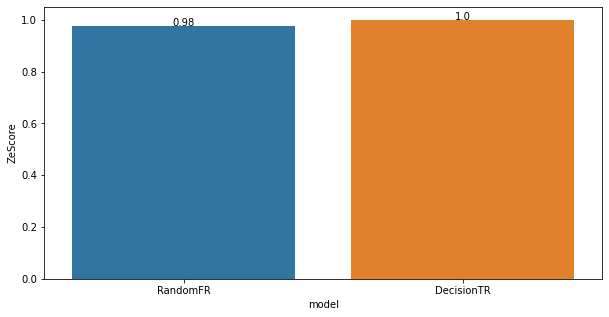

In [73]:
import seaborn as sn
figure = plt.figure(figsize=(10,5))
ax = sn.barplot(y='ZeScore', x='model', data=df_summary)
# j'ajoute les valeurs
for index, row in df_summary.iterrows():
    ax.text(row.name,row.ZeScore, round(row.ZeScore,2), color='black', ha="center")

plt.show()

Voilà, c'est ce qu'il fallait faire (cqff) 😉

                                                                                                  made by Keke with ❤ 